In [1]:
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline  

lane line을 찾는 과정 (https://github.com/udacity/CarND-Advanced-Lane-Lines#the-project)
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images. [바로가기](#1.-카메라-calibration)
- Apply a distortion correction to raw images. [바로가기](#2.-Distortion-correction)
- Use color transforms, gradients, etc., to create a thresholded binary image. [바로가기](#3.-Lane-line-검출을-위한-binary-image-생성)
- Apply a perspective transform to rectify binary image ("birds-eye view"). [바로가기](#4.-perspective-transform)
- Detect lane pixels and fit to find the lane boundary. [바로가기](#5.-Detect-lane-pixels-and-fit-to-find-the-lane-boundary)
- Determine the curvature of the lane and vehicle position with respect to center. [바로가기](#6.-curvature과-vehicle-position-계산)
- Warp the detected lane boundaries back onto the original image. [바로가기](#7.-Warp-the-detected-lane-boundaries-back-onto-the-original-image)
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position. [바로가기](#8.-원본-이미지에-차선과-부가정보-표시)

## 1. 카메라 calibration
Distortion correction을 위해 카메라의 distortion coefficients와 intrinsic parameters를 구한다. 

참고자료: http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_calibration/py_calibration.html

In [2]:
# camera calibration에 사용할 체크보드의 코너 포인트 개수 
nx,ny = 9,6

objpoints = []
imgpoints = []

# 체크보드의 각 코너에 해당하는 오브젝트 좌표계에서의 좌표를 미리 정의해둔다. 
objP = np.zeros((6*9,3), np.float32) 
objP[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

for fname in glob.glob('camera_cal/calibration*.jpg'):
    # calibration images
    img = cv2.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        objpoints.append(objP)
        imgpoints.append(corners)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    else :
        print("not found corners:", fname)

def cal_undistort(img, objpoints, imgpoints):
    # Camera calibration, given object points, image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1],None,None)
    # Undistorting a sample image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist, mtx, dist

not found corners: camera_cal/calibration1.jpg
not found corners: camera_cal/calibration4.jpg
not found corners: camera_cal/calibration5.jpg


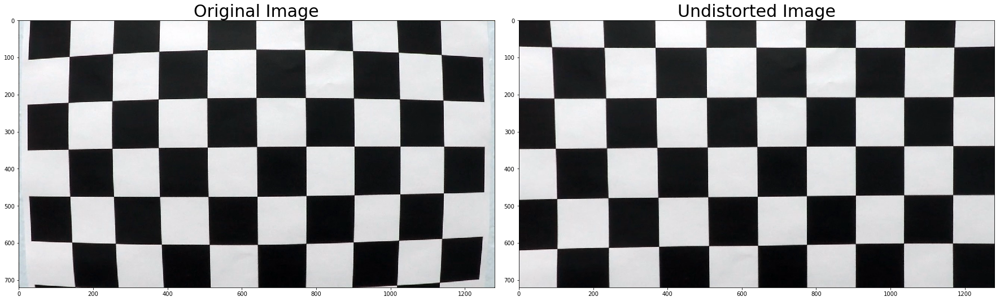

In [3]:
img = cv2.imread('camera_cal/calibration1.jpg')
undistorted, mtx, dist = cal_undistort(img, objpoints, imgpoints)

dist_pickle = {}
dist_pickle["objpoints"] = objpoints
dist_pickle["imgpoints"] = imgpoints
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
with open('wide_dist_pickle.p', 'wb') as f:
    pickle.dump(dist_pickle, f)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 2. Distortion correction

In [4]:
org_img = cv2.imread('test_images/test2.jpg')
org_img = cv2.cvtColor(org_img, cv2.COLOR_BGR2RGB)

In [5]:
dist_pickle = pickle.load( open( "wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

img = cv2.undistort(org_img, mtx, dist, None, mtx)

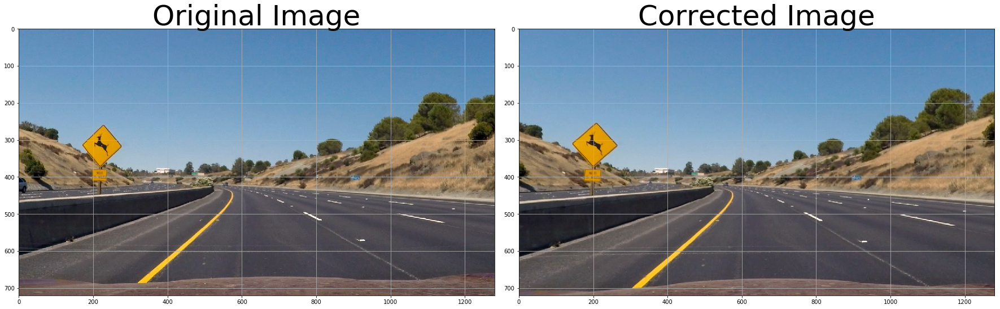

In [6]:
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(org_img)
ax1.set_title('Original Image', fontsize=50)
ax1.grid(True)
ax2.imshow(img)
ax2.set_title('Corrected Image', fontsize=50)
ax2.grid(True)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 3. Lane line 검출을 위한 binary image 생성
color transforms, gradients, sobel filter 등을 이용하여 lane line 검출에 유용한 각종 정보들을 추출하고, 결과 이미지를 병합 및 threshold 처리하여 최종 binary image를 생성한다. 

### Sobel 필터 

In [7]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

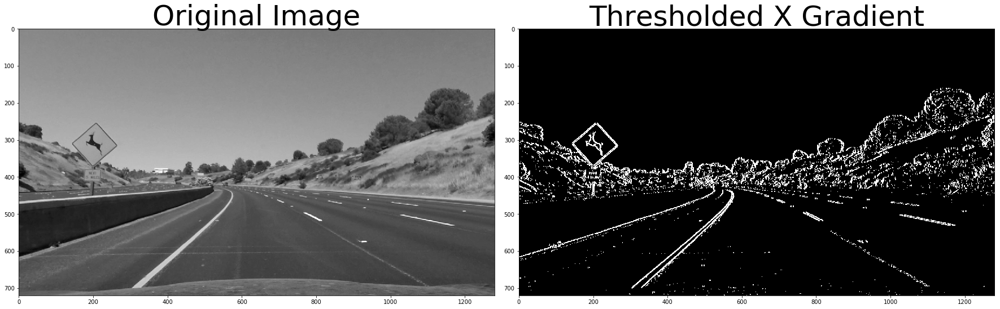

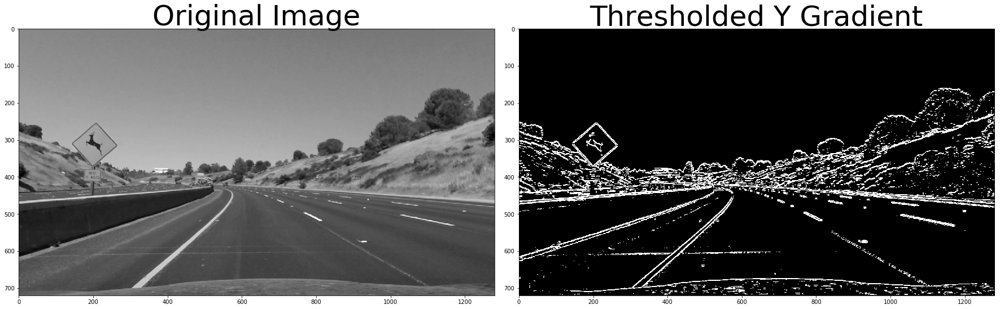

In [8]:
x_grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=255)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gray, cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(x_grad_binary, cmap='gray')
ax2.set_title('Thresholded X Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

y_grad_binary = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=255)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gray, cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(y_grad_binary, cmap='gray')
ax2.set_title('Thresholded Y Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

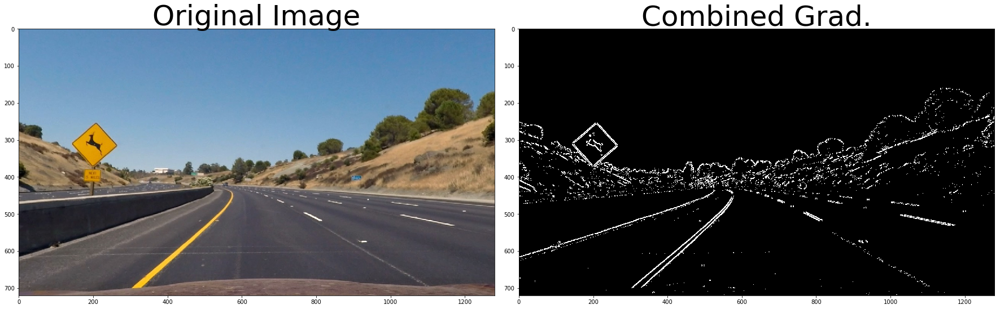

In [9]:
combined = np.zeros_like(x_grad_binary)
x_grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=255)
y_grad_binary = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=255)
combined[((x_grad_binary == 1) & (y_grad_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Grad.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    #absgraddir = np.arctan2(sobely, sobelx)
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

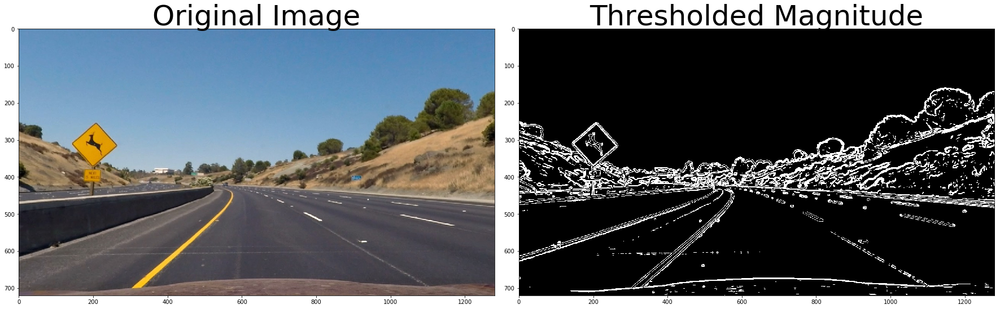

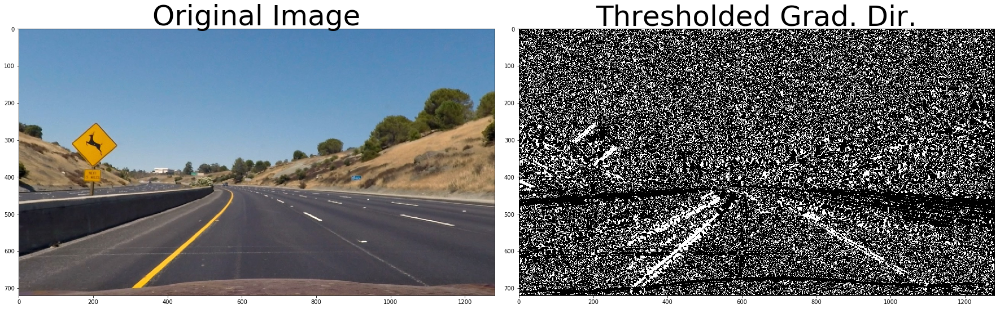

In [11]:
mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.8, 1.2))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

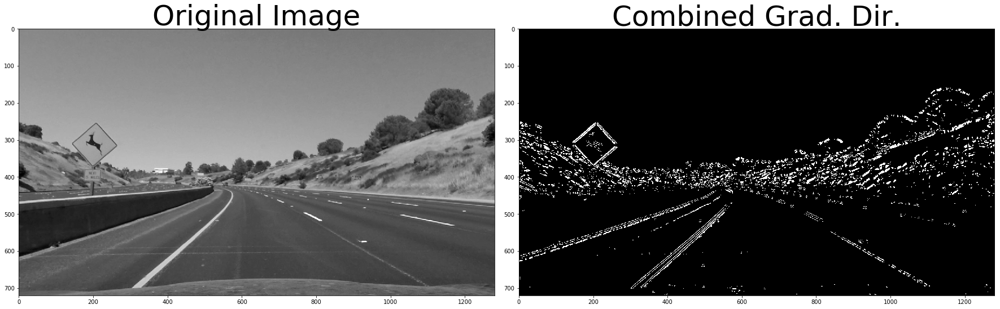

In [12]:
combined = np.zeros_like(dir_binary)
mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
combined[((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(gray, cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Color Space

In [13]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, channel, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_channel = hls[:,:,channel]
    binary_output = np.zeros_like(img_channel)
    binary_output[(img_channel > thresh[0]) & (img_channel <= thresh[1])] = 1
    return img_channel, binary_output

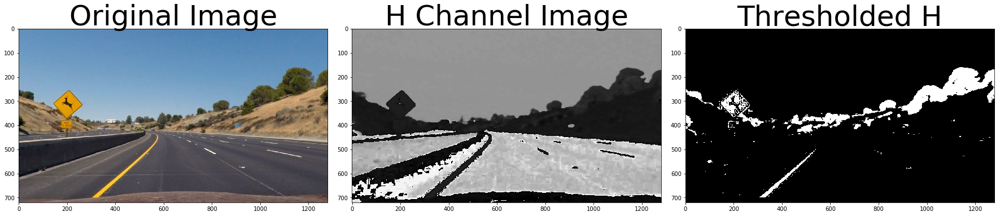

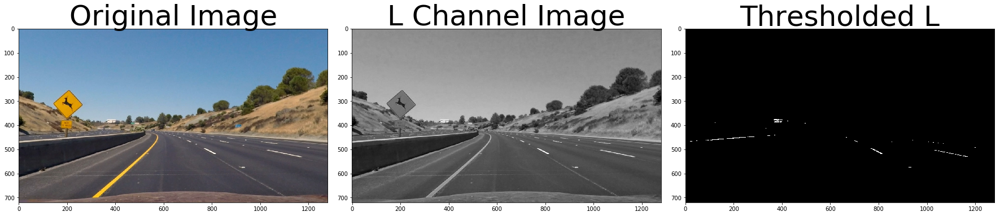

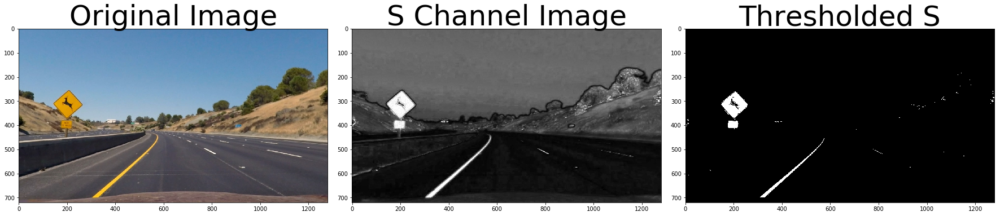

In [14]:
h_channel, h_binary = hls_select(img, channel=0, thresh=(20, 100))
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(h_channel, cmap='gray')
ax2.set_title('H Channel Image', fontsize=50)
ax3.imshow(h_binary, cmap='gray')
ax3.set_title('Thresholded H', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

l_channel, l_binary = hls_select(img, channel=1, thresh=(200, 255))
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(l_channel, cmap='gray')
ax2.set_title('L Channel Image', fontsize=50)
ax3.imshow(l_binary, cmap='gray')
ax3.set_title('Thresholded L', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

s_channel, s_binary = hls_select(img, channel=2, thresh=(200, 255))
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_channel, cmap='gray')
ax2.set_title('S Channel Image', fontsize=50)
ax3.imshow(s_binary, cmap='gray')
ax3.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

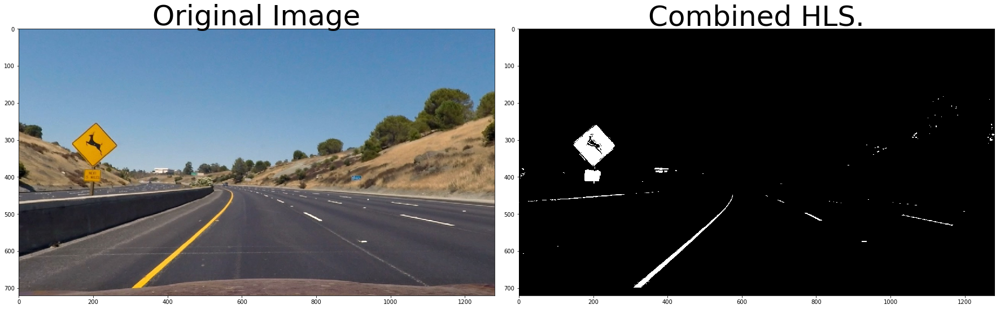

In [15]:
combined = np.zeros_like(s_binary)
_, l_binary = hls_select(img, channel=1, thresh=(200, 255))
_, s_binary = hls_select(img, channel=2, thresh=(200, 255))
combined[((l_binary == 1) | (s_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined HLS.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

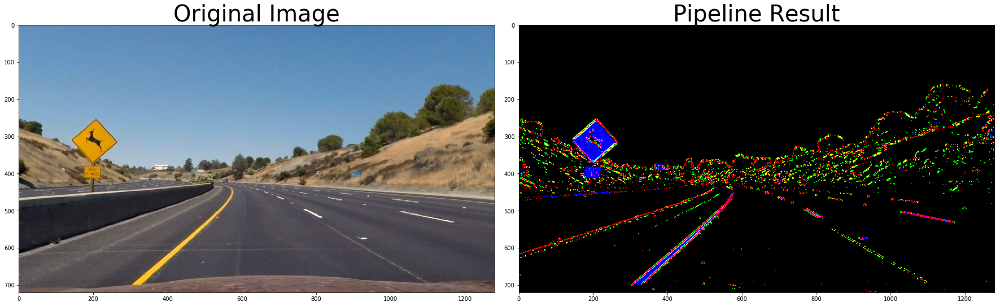

In [16]:
def pipeline_udacity(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    return color_binary.astype(np.uint8)

def pipeline_binary(img, grad_thresh_val=(20, 255), mag_thresh_val=(30, 100), 
             dir_thresh_val=(0.8, 1.2), col_thresh_val=(200, 255)):
    img = np.copy(img)
    
    x_grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=grad_thresh_val[0], thresh_max=grad_thresh_val[1])
    y_grad_binary = abs_sobel_thresh(img, orient='y', thresh_min=grad_thresh_val[0], thresh_max=grad_thresh_val[1])

    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=mag_thresh_val)
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=dir_thresh_val)

    _, l_binary = hls_select(img, channel=1, thresh=col_thresh_val)
    _, s_binary = hls_select(img, channel=2, thresh=col_thresh_val)
    
    combined_grad = np.zeros_like(x_grad_binary)
    combined_dir = np.zeros_like(dir_binary)
    combined_col = np.zeros_like(s_binary)

    combined_grad[((x_grad_binary == 1) & (y_grad_binary == 1))] = 1
    combined_dir[((mag_binary == 1) & (dir_binary == 1))] = 1
    combined_col[((l_binary == 1) | (s_binary == 1))] = 1
    #plt.figure(); plt.imshow(combined_col, cmap='gray')
    #print(combined_grad.shape)
    #print(combined_dir.shape)
    #print(combined_col.shape)
    
    color_binary = np.dstack(( combined_grad, combined_dir, combined_col)) * 255
    return color_binary.astype(np.uint8)
    
result = pipeline_binary(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 4. perspective transform 
binary image를 rectify하면 birds-eye view로 관찰하는 효과를 줄 수 있다. 

In [17]:
img_size = result.shape[1::-1]

src = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 60), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
print(src)
print(dst)

[[  580.           460.        ]
 [  203.33332825   720.        ]
 [ 1126.66662598   720.        ]
 [  700.           460.        ]]
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]


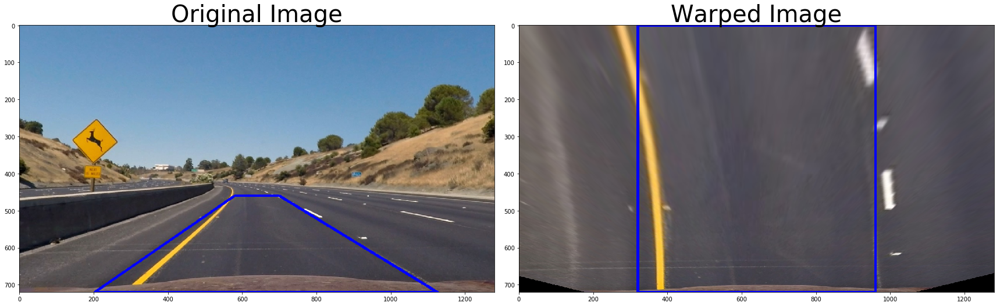

In [18]:
src_img = img.copy()
pts = np.array(src, np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(src_img,[pts],True,(0,0,255),5)

# Compute the perspective transform, M, given source and destination points:
M = cv2.getPerspectiveTransform(src, dst)

# Compute the inverse perspective transform:
Minv = cv2.getPerspectiveTransform(dst, src)

# Warp an image using the perspective transform, M:
warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
pts = np.array(dst, np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(warped,[pts],True,(0,0,255),5)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(src_img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=40)

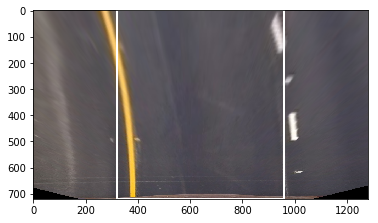

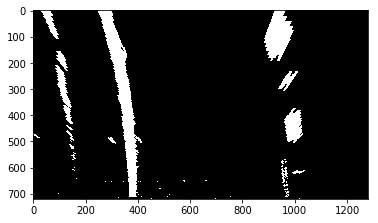

In [19]:
warped_result = cv2.warpPerspective(result, M, img_size, flags=cv2.INTER_LINEAR)

warped_sum = np.sum(warped_result, axis=2)
binary_warped = np.zeros_like(warped_sum)
binary_warped[(warped_sum != 0)] = 1
cv2.polylines(warped,[pts],True,(255,255,255),5)

plt.figure(); plt.imshow(warped, cmap='gray')
plt.figure(); plt.imshow(binary_warped, cmap='gray')

## 5. Detect lane pixels and fit to find the lane boundary

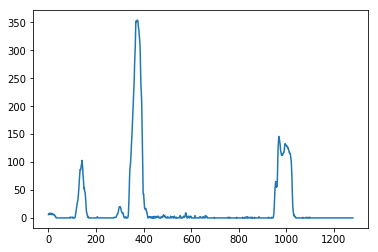

In [20]:
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [21]:
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
out_img = out_img.astype(np.uint8)
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

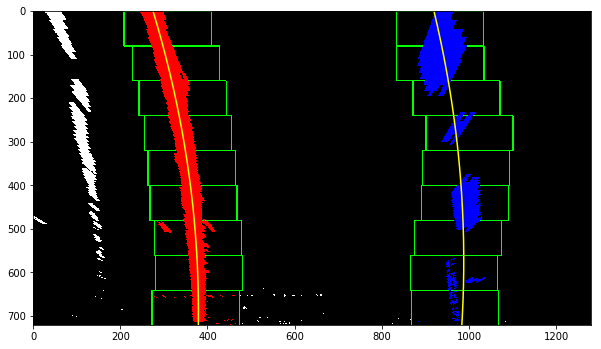

In [22]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.figure(figsize = (10,20))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [23]:
def fit_lines_from_scratch(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    out_img = out_img.astype(np.uint8)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit

(720, 0)

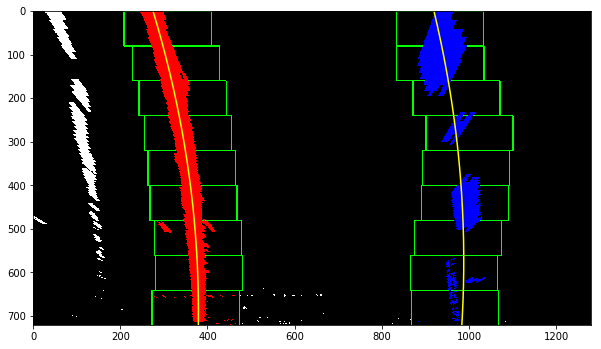

In [24]:
left_fit, right_fit = fit_lines_from_scratch(binary_warped)
    
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

plt.figure(figsize = (10,20))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [25]:
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(720, 0)

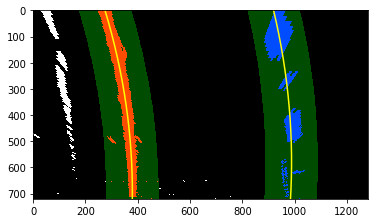

In [26]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
out_img = out_img.astype(np.uint8)
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [27]:
def fit_lines_with_previous_lines(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit

In [28]:
left_fit, right_fit = fit_lines_with_previous_lines(binary_warped, left_fit, right_fit)

(720, 0)

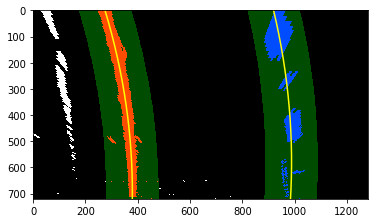

In [29]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
    
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
out_img = out_img.astype(np.uint8)
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


## 6. curvature과 vehicle position 계산

[ -2.17263354e-04   3.01271458e-01   2.75173056e+02] [ -2.04478282e-04   2.36859686e-01   9.19635466e+02]


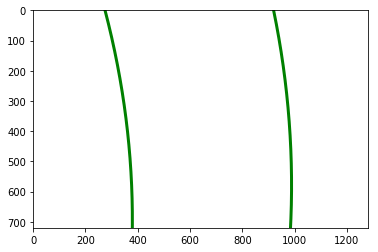

In [30]:
# Fit a second order polynomial to pixel positions in each fake lane line
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

print(left_fit, right_fit)
# Plot up the fake data
mark_size = 3
#plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
#plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

In [31]:
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)

# 이미지 좌표계상에서의 curvature
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print('curvature (image coord):', left_curverad, right_curverad)

curvature (image coord): 2301.78393724 2457.24958531


In [32]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

# Calculate the new radii of curvature (실좌표계에서의 curvature)
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

# Now our radius of curvature is in meters
print('curvature (real coord):', left_curverad, 'm', right_curverad, 'm')

# 좌/우 lane line의 시작점 x좌표
left_fit_pos = left_fitx[-1]
right_fit_pos = right_fitx[-1]
print('left/right x position:', left_fit_pos, right_fit_pos)

curvature (real coord): 755.890105799 m 803.213360242 m
left/right x position: 379.470553092 984.230282293


## 7. Warp the detected lane boundaries back onto the original image

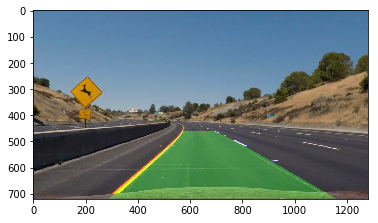

In [33]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
color_warp = color_warp.astype(np.uint8)

# Draw the lane lines
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(img, 0.9, newwarp, 0.3, 0)
plt.imshow(result)

## 8. 원본 이미지에 차선과 부가정보 표시

In [34]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [35]:
dist_pickle = pickle.load( open( "wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

src = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 60), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

left_lane_line = Line()
right_lane_line = Line()

def calc_curvature(binary_warped, left_fit, right_fit):
    #global left_lane_line
    #global right_lane_line
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    left_fit_pos = left_fitx[-1]
    right_fit_pos = right_fitx[-1]
    
    return left_curverad, right_curverad, left_fit_pos, right_fit_pos

def process_image(org_img):
    img = cv2.undistort(org_img, mtx, dist, None, mtx)
    result = pipeline_binary(img)
    warped_result = cv2.warpPerspective(result, M, img_size, flags=cv2.INTER_LINEAR)
    
    #warped_sum = np.sum(warped_result, axis=2)
    warped_sum = np.sum(warped_result[:,:,(1,2)], axis=2)
    binary_warped = np.zeros_like(warped_sum)
    binary_warped[(warped_sum != 0)] = 1
    
    '''''''''''''''''''''''''''
    lane line 피팅
    '''''''''''''''''''''''''''
    if len(left_lane_line.recent_xfitted) == 0 or len(right_lane_line.recent_xfitted) == 0:
        left_fit, right_fit = fit_lines_from_scratch(binary_warped)
    else :
        left_fit, right_fit = fit_lines_with_previous_lines(binary_warped, 
                                                            left_lane_line.best_fit, 
                                                            right_lane_line.best_fit)
    
    '''''''''''''''''''''''''''
    curvature, 차량 위치 계산
    '''''''''''''''''''''''''''
    left_curverad, right_curverad, left_fit_pos, right_fit_pos = calc_curvature(binary_warped, left_fit, right_fit)
        
    '''''''''''''''''''''''''''
    Sanity Check, Reset, Smoothing
    '''''''''''''''''''''''''''
    # Sanity Check
    # Checking that they have similar curvature
    if np.abs(left_curverad - right_curverad) > 500:
        #print('similar curvature')
        left_lane_line.detected = False
        right_lane_line.detected = False
    # Checking that they are separated by approximately the right distance horizontally
    elif np.abs(left_fit_pos - right_fit_pos) < (img_size[0] / 3):
        #print('separated', left_fit_pos, right_fit_pos, (img_size[0] / 3))
        left_lane_line.detected = False
        right_lane_line.detected = False
    # Checking that they are roughly parallel
    elif (left_fit[0] * right_fit[0]) < 0 or (left_fit[1] * right_fit[1]) < 0:
        #print('parallel')
        left_lane_line.detected = False
        right_lane_line.detected = False
    else :
        left_lane_line.detected = True
        right_lane_line.detected = True
    
    # Reset, Smoothing
    if left_lane_line.detected == True and right_lane_line.detected == True:
        left_lane_line.current_fit = left_fit
        right_lane_line.current_fit = right_fit
        if len(left_lane_line.recent_xfitted) == 0 or len(right_lane_line.recent_xfitted) == 0:
            left_lane_line.best_fit = left_lane_line.current_fit
            right_lane_line.best_fit = right_lane_line.current_fit
        else :
            left_lane_line.best_fit = left_lane_line.best_fit * 0.8 + left_lane_line.current_fit * 0.2
            right_lane_line.best_fit = right_lane_line.best_fit * 0.8 + right_lane_line.current_fit * 0.2
        
        left_lane_line.recent_xfitted.insert(0, left_fit_pos)
        right_lane_line.recent_xfitted.insert(0, right_fit_pos)
            
        if len(left_lane_line.recent_xfitted) > 5:
            left_lane_line.recent_xfitted.pop()
        if len(right_lane_line.recent_xfitted) > 5:
            right_lane_line.recent_xfitted.pop()
    else :
        #print('Sanity Check: Fail!')
        left_lane_line.current_fit = left_lane_line.best_fit
        right_lane_line.current_fit = right_lane_line.best_fit
        
        if len(left_lane_line.recent_xfitted) != 0:
            left_lane_line.recent_xfitted.pop()
        if len(right_lane_line.recent_xfitted) != 0:
            right_lane_line.recent_xfitted.pop()
          
    left_fit = left_lane_line.current_fit
    right_fit = right_lane_line.current_fit
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    '''''''''''''''''''''''''''
    피팅 라인 표시
    '''''''''''''''''''''''''''
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((binary_warped, binary_warped, binary_warped))
    color_warp = color_warp.astype(np.uint8)
    
    # Draw the lane lines
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
        left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
        right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))    
    color_warp[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    color_warp[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 0.9, newwarp, 0.3, 0)
    
    '''''''''''''''''''''''''''
    curvature, 차량 위치 표시
    '''''''''''''''''''''''''''
    left_curverad, right_curverad, left_fit_pos, right_fit_pos = calc_curvature(binary_warped, left_fit, right_fit)
    
    idial_center_pos = (left_fit_pos + right_fit_pos)/2.0
    vehicle_center_pos = img.shape[1]/2.0
    center_diff = (idial_center_pos - vehicle_center_pos) * xm_per_pix
    if center_diff < 0:
        position = 'right'
    else :
        position = 'left'
    
    # Now our radius of curvature is in meters
    cv2.putText(result,"Radius of Curvature = {:.2f}(m)".format((left_curverad+right_curverad)/2), 
                (100,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255))
    cv2.putText(result,"Vehicle is {:.2f}m {} of center".format(np.abs(center_diff), position), 
                (100,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255))
    
    return result

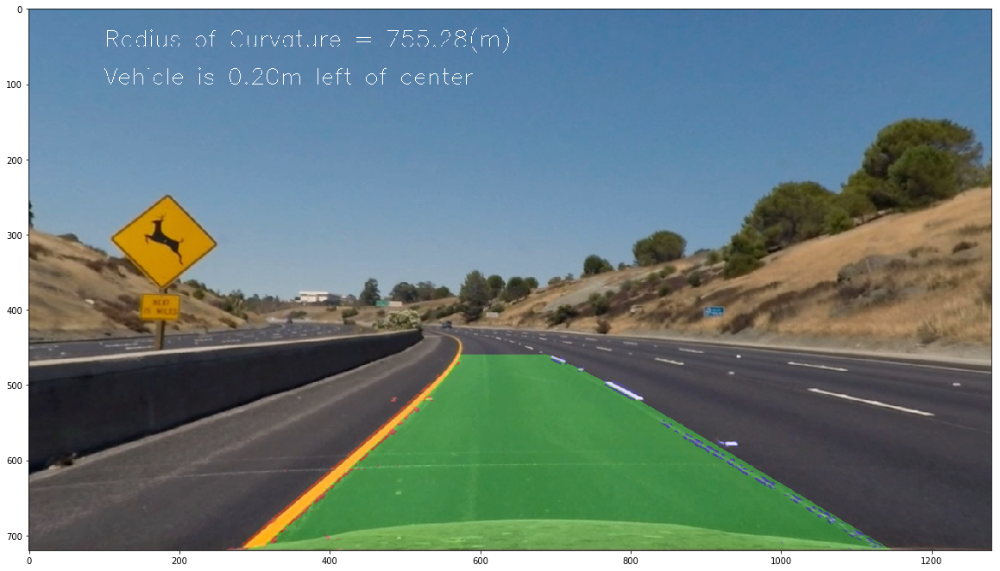

In [36]:
#img = cv2.imread('test_images/test5.jpg')
#img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = process_image(img)
plt.figure(figsize=(20,40))
plt.imshow(img, cmap='gray')


In [37]:
# Import everything needed to edit/save/watch video clips
import imageio
imageio.plugins.ffmpeg.download()

from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [38]:
white_output = 'project_video_result.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████▉| 1260/1261 [06:50<00:00,  2.83it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

CPU times: user 6min 36s, sys: 1min 37s, total: 8min 14s
Wall time: 6min 51s
